In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import panel as pn
pn.extension('plotly')
import hvplot.pandas
import requests
import yfinance as yf
import seaborn as sns

import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from pathlib import Path
from dotenv import load_dotenv
from panel.interact import interact

In [2]:
etf_df = yf.download(['XLC','XLY','XLP','XLE','XLF','XLV','XLI','XLB','XLRE','XLK','XLU','SPY'],
                      start='2020-01-01',
                      end='2020-12-31',
                      progress=False)
etf_df = etf_df['Close']

resp = requests.get("https://api.covidtracking.com/v1/us/daily.json")
data = resp.text
corona_df = pd.read_json(data)

#Data cleanup
covid_df = corona_df[["date","positive", "negative", "hospitalizedCumulative","death"]]
covid_df.dropna(inplace=True)


#Change format of data column
covid_df['date'] = pd.to_datetime(covid_df['date'], format='%Y%m%d')

covid_df=covid_df.sort_values('date').set_index('date')

#create two dataframes for march month and from april months

march_df = covid_df['2020-03-01':'2020-03-31']
from_april  = covid_df['2020-04-01':]

etf_march_df = yf.download(['XLC','XLY','XLP','XLE','XLF','XLV','XLI','XLB','XLRE','XLK','XLU','SPY'],
                      start='2020-03-01',
                      end='2020-03-31',
                      progress=False)
etf_march_df = etf_march_df['Close']

etf_fromapril_df = yf.download(['XLC','XLY','XLP','XLE','XLF','XLV','XLI','XLB','XLRE','XLK','XLU','SPY'],
                      start='2020-04-01',
                      end='2020-12-31',
                      progress=False)
etf_fromapril_df = etf_fromapril_df['Close']

C:\Users\peter\anaconda3\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\peter\anaconda3\envs\pyvizenv\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [139]:
Introduction_page= pn.Row(pn.pane.Markdown(
    "# Novel Coronavirus Impact on US Stock Market by Sectors \n"
    "## A high level analysis of the stock market sector ETFs closing prices to the Coronavirus\n"
    "### By: Sravani Racharla, Kumar Bodana, and Peter Loft\n\n"
    #Motivation & Summary Section
    "# Motiviation & Summary"
    "\n\nSince late February our lives have been completely upended by an invisible force, one which many of us never dreamed would come to our shores. A viral pandemic"
    " Jobs have been lost, some irrevocably, people have been dislocated from schooling, work, even from their families. Yet since, an early and historically precipitous drop in the stock market to parallel the societal fibrillations to come, in many industries the market has already recovered; many sectors rising to yearly highs."
    " It was this seemingly incongruous divergence of Wall St. from Main St. that motivated us to investigate: What has been the coronavirus’ impact on the US ETF market.<br>"
    "<br>"
    "\n\nWe saw fit to ask three questions:"
        "\n\nWhat has been the influence of the coronavirus on the US ETF market? "
        "\n\nHow was the influence felt across market sectors?" 
        "\n\nHow did Individual players fare vs their sectors?<br>"
    "<br>"
    "We were able to answer the questions we put to our data satisfactorily."
    " From our analysis, we have determined that despite the initial plunge in stock markets prices, there is no definitive and proveable correlation between Covid testing, deaths, nor hospitalizations on a macro scale."
    " Of course, our analysis did provide us with rates of loss and recovery, but there was not a reproducible pattern throughout our subjects."
    " Some sectors were obviously hit harder than others, as we will explore in our visualizations later on."
    " As of now, our data suggests covid’s impact, or rather mitigating the impact, was the determinant of a company’s success."
    #Data & Questions
    "\n\n# Questions & Data"
    "\n\nOur questions surrounded the interplay of covid and the stock market, specifically ETFs, so we needed to find reliable data sources for both. Our approach was to take historical closing price data for the ETFs and then compare them to the available Covid data on the same day. "
    " We chose the free financial resource yfinance (https://pypi.org/project/yfinance/), an open-source project started to bridge the functionality gap when Yahoo! Finance decommissioned their historical data API."
    " This provided us with closing prices for the 11 sector ETFs we used to compare our Coronavirus data we sourced from the free Covidtracking API (https://api.covidtracking.com/v1/us/daily.json)."
    #Data Cleanup & Exploration
    "\n\n# Data Cleanup & Exploration"
    "\n\nDue to the reliability of our sources, there was not much cleanup involved once the data was pulled. However, marrying the two different sources did result in null values throwing off initial explorations." 
    " With application of basic cleaning skills, we were able to move past this one hiccup and successfully begin our analysis."
    " Despite the initial drop in prices in March at the beginning of the United State's pandemic, we were unable to locate specific quantifiable correlations between our sectors and the progression of the coronavirus.\n"
    " The initial lack of correlation led us to look at a more granular level; now including individual stocks to compare against their respective sectors as well."
    #Data Analysis
    "\n\n# Data Analysis"
    "\n\nWe decided to begin our analysis at the highest level and then move on to more specific levels." 
    " Using standard deviation and correlation functions from the numpy library, we compared all the sectors and the S&P 500 index against each other and the cumulative coronavirus deaths, positive/negative testing, and hospitalizations."
    " When no obvious connections were revealed, we strove deeper. We examined the eleven sectors themselves in greater detail, against a small sample of industry specific players and the same covid data from before.\n"
    #Present and discuss interesting figures developed during analysis, ideally with the help of Jupyter Notebook.
    "\n"
    #Discussion
    "\n\n# Discussion"
    "\n\nOur findings were surprising, and not exactly what we expected. We expected there to be visible changes in market performance coincident with the ebb and flow of covid deaths, hospitalizations, and positive tests. However, it appears that almost all of the price loss, although steep initially, was contained to March of 2020. Since then, the greater market, with exception of some sectors lagging, has been on an upward trend since the nadir.\n"
    " This appears to be a slightly reactionary outcome based off forward looking traders fear of the potential to come. None escaped the downturn in March, but many outperforming sectors and individual stocks rose to the occasion, surpassing the beginning of the year. The hardest hit sector was Energy which has continued to decline, albeit at a much slower rate. Utilities and Real Estate have recovered from their lowest prices considerably, but remain the two slowest laggards in recovery respectively."
    #Postmortem
    "\n\n# Postmortem"
    "\n\nWe had some issues with our functions not acting entirely as we intended. Particularly the '.corrwith' function for analyzing correlations between two separate Dateframes returning 'NaN' values and the '.dropna' function too. Several times we realized we had accidentally excised relevant data by dropping values from dataframes before concatenating them, which led to slightly skewed results before correction."
    " We were interested in consumer sentiment, how did investors react to the covid pandemic and translate that into their investing strategies. Could this have been more impactful than the actual progress of the virus? We would've also liked a bit more time to include a regression analysis for the sectors, since this aspect of our analysis brought together the most disparate variables, stocks, etfs, covid data, we later realized regression could be a powerful tool to draw some additional connection insights. \n",
    width= 1000),
    
)

In [100]:
def market_comparison():
    market_comparison = etf_df[['XLC','XLY','XLP','XLE','XLF','XLV','XLI','XLB','XLRE','XLK','XLU','SPY']]
    change_comparison=market_comparison.pct_change()
    change_comparison.dropna(inplace=True)
    plot_chg_compare = change_comparison.hvplot(title = "Sector ETF's Daily Percent Change", width=1400, height=750);
    return plot_chg_compare


In [101]:
def total_covid_market_mixture():
    
    resp = requests.get("https://api.covidtracking.com/v1/us/daily.json")
    resp.json()
    data = resp.text
    covid_df = pd.read_json(data)
    covid_df['date'] = pd.to_datetime(covid_df['date'], format = '%Y%m%d')
    trackables_df = covid_df[['date', 'death', 'positive', 'negative']]
    sorted_trackables = trackables_df.sort_values('date').set_index('date')
    combined_dfs = pd.concat([etf_df,sorted_trackables], axis="columns")
    combined_dfs_nw = combined_dfs.dropna()
    combined_dfs_noweekends = combined_dfs.dropna()

    combined_dfs_noweekends.reset_index(inplace=True)
    combined_dfs_noweekends = combined_dfs_noweekends.rename(columns={"index":"date"})
    
    covid_break = sorted_trackables.hvplot(kind= 'line', rot=45, width=600, height=250, subplots=True, shared_axes=False).cols(1)

    etf_combine = combined_dfs_noweekends.hvplot(title = "Sector ETF's in the Times of Covid", x='date', y=['XLC','XLY','XLP','XLE','XLF','XLV','XLI','XLB','XLRE','XLK','XLU'], ylabel = "Closing Price", rot=45, width=900, height=750, shared_axes=False)
    totals_combo = etf_combine + covid_break
    return totals_combo

In [102]:
def heatmap_func():  
    market_comparison1 = etf_df[['XLC','XLY','XLP','XLE','XLF','XLV','XLI','XLB','XLRE','XLK','XLU','SPY']]
    fig, ax = plt.subplots(figsize=(10,6.5))
    ax.set_title('Sector ETF Current Year Correlation')
    heaty_boy = sns.heatmap(market_comparison1.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
    #fig = heaty_boy.get_figure()
    return heaty_boy

def corona_heatmap():
    combined_dfs = pd.concat([etf_df,covid_df], axis="columns")
    combined_dfs_nw = combined_dfs.dropna()

    fig, ax = plt.subplots(figsize=(10,7))
    ax.set_title('Coronavirus Correlation Heatmap')
    covid_heat = sns.heatmap(combined_dfs_nw.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
    return covid_heat

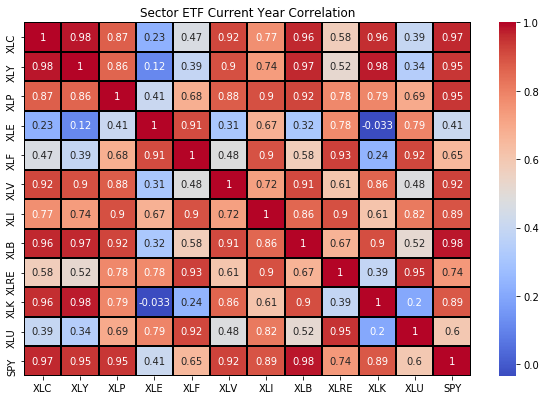

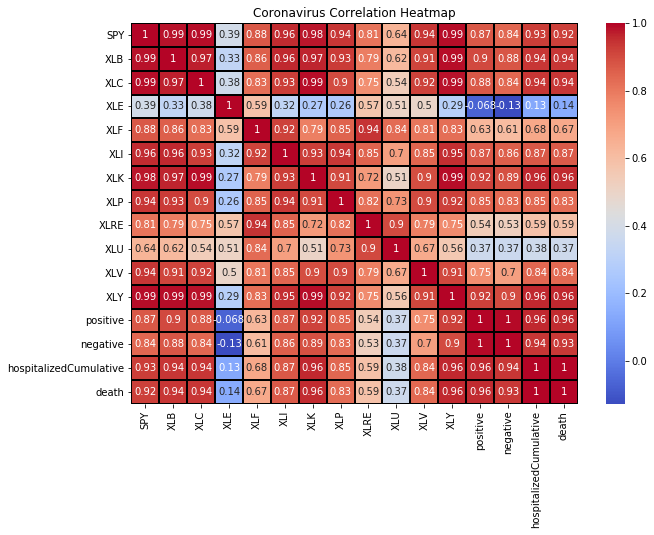

In [103]:
heat_map_row_intro = pn.Row(heatmap_func())
heat_map_row_intro.append(corona_heatmap())

In [104]:
Market_Overview_pg = pn.Column(
    "## Here we have the total performance of our analyzed sectors from the beginning of the year, until today. Using our API, we are continually requesting and refreshing the information for up-to-date values.",
    total_covid_market_mixture(),
    "## In this graph we can visualize the daily changes of our sectors over the year as indicators of their volatility.\n", 
    "You may select or deslect ETFs by clicking on the ticker symbol legend.",
    market_comparison(),
    "## With this heat map we explored the relations between the sectors themselves over the pandemic period on the left. On the right, we examine the coronavirus data's correlation with the ETFs.",
    heat_map_row_intro,
    "Note: Positive, Negative, and Cumulative refer to covid testing results and total hospitalizations since the pandemic began."
)

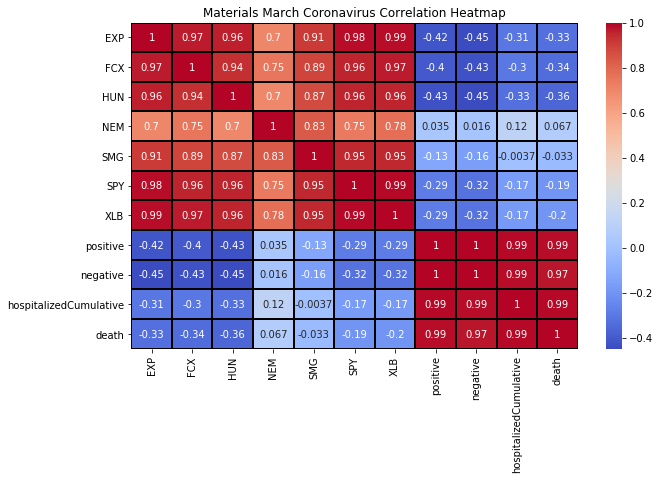

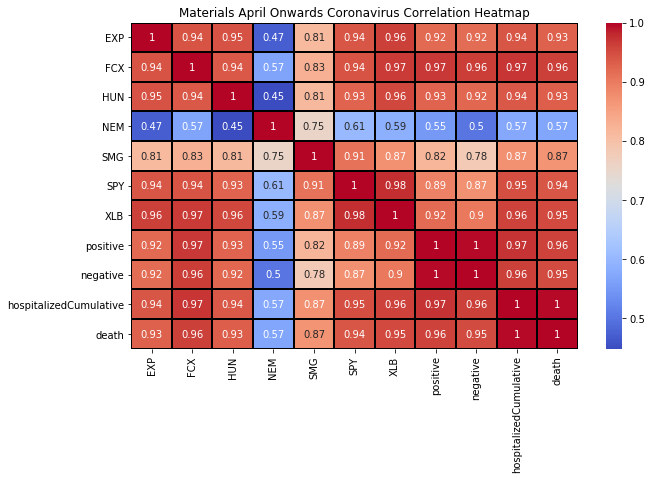

In [105]:
materials_df = yf.download(['HUN','EXP','NEM','FCX','SMG','SPY','XLB'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
materials_df = materials_df['Close']
materials_march_df = pd.concat([materials_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Materials March Coronavirus Correlation Heatmap')
materials_march_plot = sns.heatmap(materials_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

material_df = yf.download(['HUN','EXP','NEM','FCX','SMG','SPY','XLB'],
              start='2020-04-01',
              end='2020-12-31',
              progress=False)
material_df = material_df['Close']
materials_fromapril_df = pd.concat([material_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Materials April Onwards Coronavirus Correlation Heatmap')
materials_fromapril_plot = sns.heatmap(materials_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [106]:
heat_map_row_materials = pn.Row(materials_march_plot)
heat_map_row_materials.append(materials_fromapril_plot)

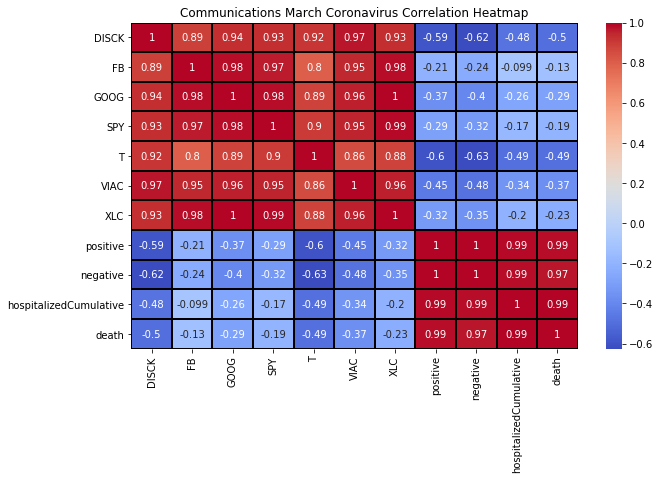

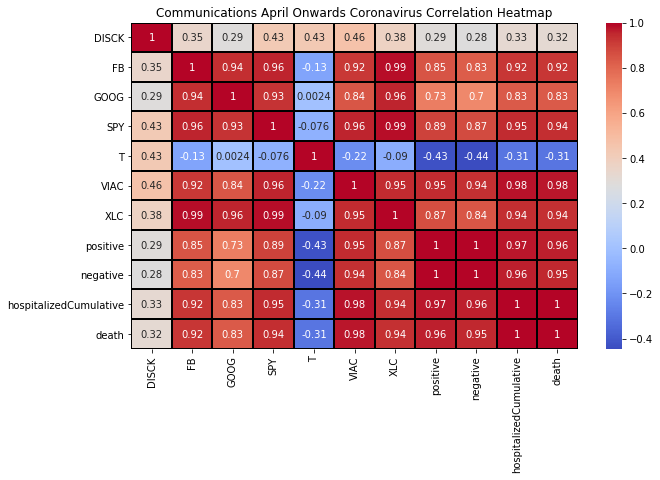

In [107]:
communications_df = yf.download(['VIAC','T','DISCK','FB','GOOG','SPY','XLC'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
communications_df = communications_df['Close']
communications_march_df = pd.concat([communications_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Communications March Coronavirus Correlation Heatmap')
communications_march_plot = sns.heatmap(communications_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
communications_df = yf.download(['VIAC','T','DISCK','FB','GOOG','SPY','XLC'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
communications_df = communications_df['Close']
communications_fromappril_df = pd.concat([communications_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Communications April Onwards Coronavirus Correlation Heatmap')
communications_fromapril_plot = sns.heatmap(communications_fromappril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [108]:
heat_map_row_communications = pn.Row(communications_march_plot)
heat_map_row_communications.append(communications_fromapril_plot)

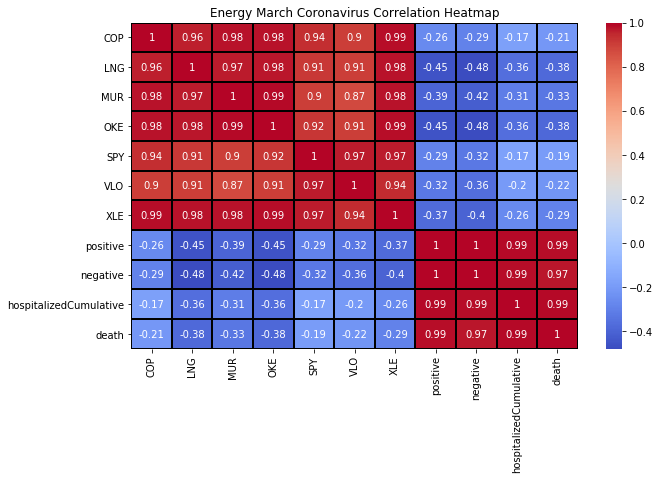

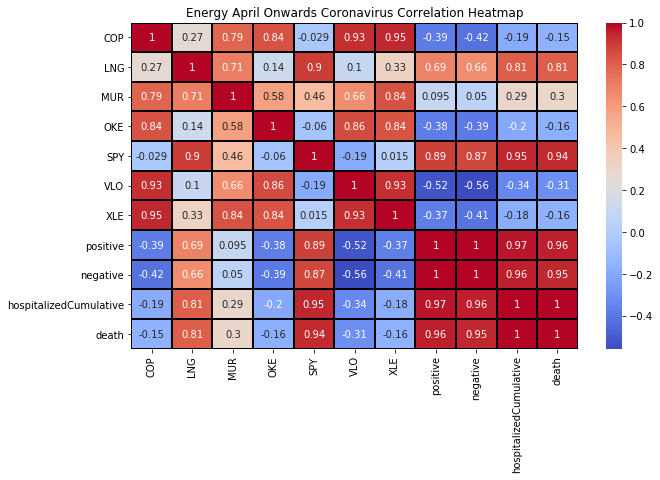

In [109]:
energy_df = yf.download(['OKE','COP','VLO','LNG','MUR','SPY','XLE'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
energy_df = energy_df['Close']
energy_march_df = pd.concat([energy_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Energy March Coronavirus Correlation Heatmap')
energy_march_plot = sns.heatmap(energy_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
energy_df = yf.download(['OKE','COP','VLO','LNG','MUR','SPY','XLE'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
energy_df = energy_df['Close']
energy_fromapril_df = pd.concat([energy_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Energy April Onwards Coronavirus Correlation Heatmap')
energy_fromapril_plot = sns.heatmap(energy_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [110]:
heat_map_row_energy = pn.Row(energy_march_plot)
heat_map_row_energy.append(energy_fromapril_plot)

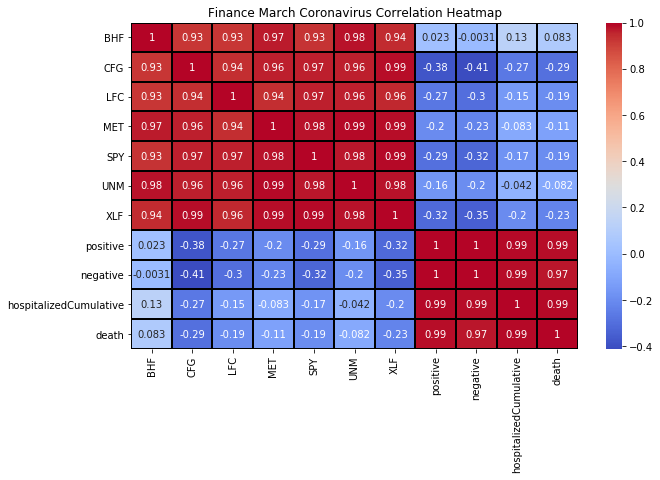

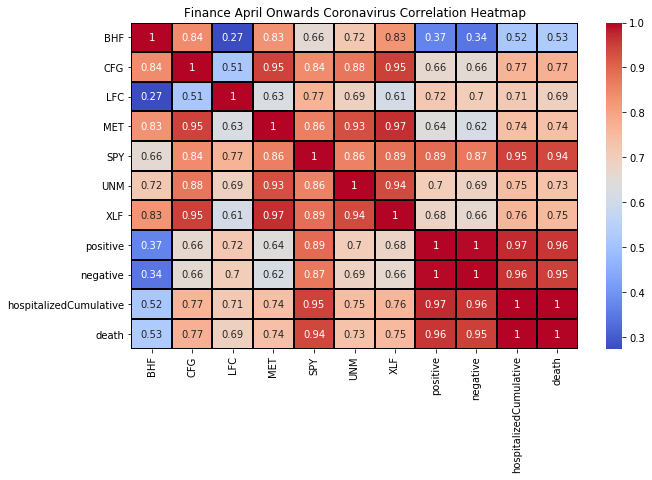

In [111]:
finance_df = yf.download(['BHF','UNM','MET','CFG','LFC','SPY','XLF'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
finance_df = finance_df['Close']
finance_march_df = pd.concat([finance_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Finance March Coronavirus Correlation Heatmap')
finance_march_plot = sns.heatmap(finance_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
finance_df = yf.download(['BHF','UNM','MET','CFG','LFC','SPY','XLF'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
finance_df = finance_df['Close']
finance_fromapril_df = pd.concat([finance_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Finance April Onwards Coronavirus Correlation Heatmap')
finance_fromapril_plot = sns.heatmap(finance_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()


In [112]:
heat_map_row_finance = pn.Row(finance_march_plot)
heat_map_row_finance.append(finance_fromapril_plot)

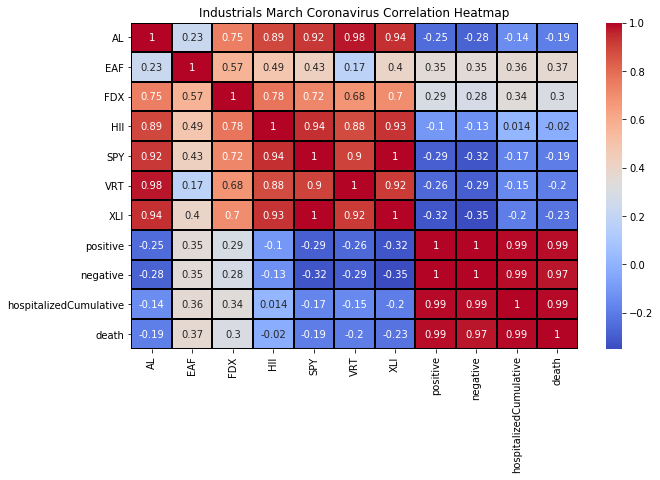

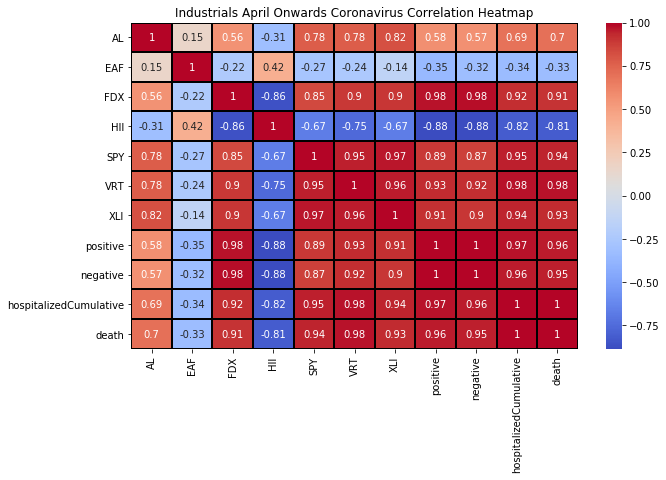

In [113]:
industrial_df = yf.download(['EAF','AL','HII','FDX','VRT','SPY','XLI'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
industrial_df = industrial_df['Close']
industrial_march_df = pd.concat([industrial_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Industrials March Coronavirus Correlation Heatmap')
industrial_march_plot = sns.heatmap(industrial_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
industrial_df = yf.download(['EAF','AL','HII','FDX','VRT','SPY','XLI'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
industrial_df = industrial_df['Close']
industrial_fromapril_df = pd.concat([industrial_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Industrials April Onwards Coronavirus Correlation Heatmap')
industrial_fromapril_plot = sns.heatmap(industrial_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [114]:
heat_map_row_industrial = pn.Row(industrial_march_plot)
heat_map_row_industrial.append(industrial_fromapril_plot)

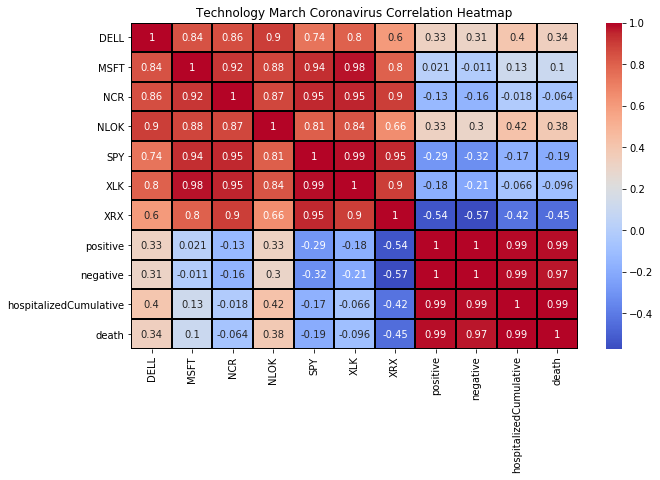

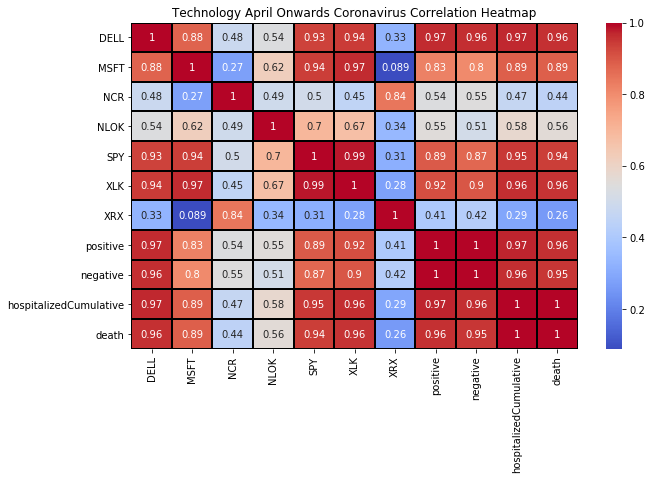

In [115]:
technology_df = yf.download(['MSFT','DELL','NLOK','XRX','NCR','SPY','XLK'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
technology_df = technology_df['Close']
technology_march_df = pd.concat([technology_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Technology March Coronavirus Correlation Heatmap')
technology_march_plot = sns.heatmap(technology_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
technology_df = yf.download(['MSFT','DELL','NLOK','XRX','NCR','SPY','XLK'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
technology_df = technology_df['Close']
technology_fromapril_df = pd.concat([technology_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Technology April Onwards Coronavirus Correlation Heatmap')
technology_fromapril_plot = sns.heatmap(technology_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [116]:
heat_map_row_technology = pn.Row(technology_march_plot)
heat_map_row_technology.append(technology_fromapril_plot)

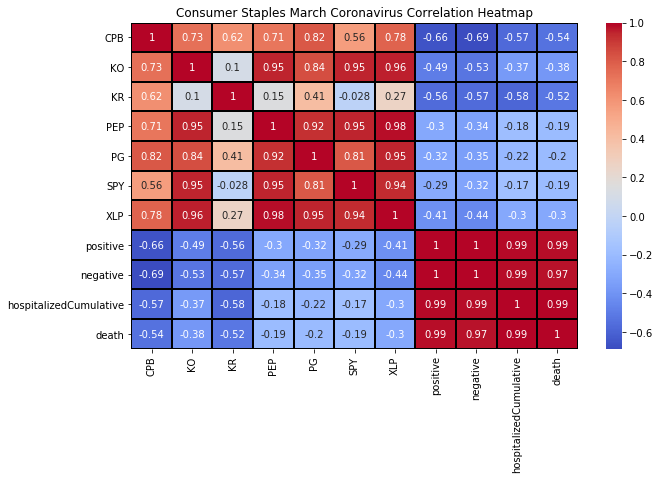

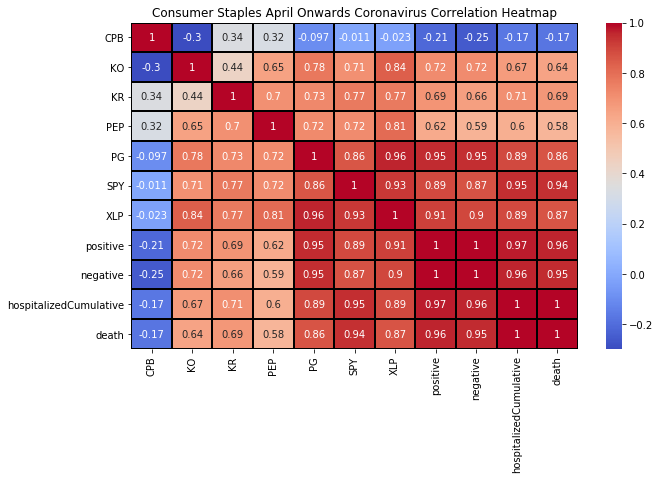

In [117]:
cs_df = yf.download(['PEP','CPB','KR','PG','KO','SPY','XLP'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
cs_df = cs_df['Close']
cs_march_df = pd.concat([cs_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Consumer Staples March Coronavirus Correlation Heatmap')
cs_march_plot = sns.heatmap(cs_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
cs_df = yf.download(['PEP','CPB','KR','PG','KO','SPY','XLP'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
cs_df = cs_df['Close']
cs_fromapril_df = pd.concat([cs_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Consumer Staples April Onwards Coronavirus Correlation Heatmap')
cs_fromapril_plot = sns.heatmap(cs_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [118]:
heat_map_row_cs = pn.Row(cs_march_plot)
heat_map_row_cs.append(cs_fromapril_plot)

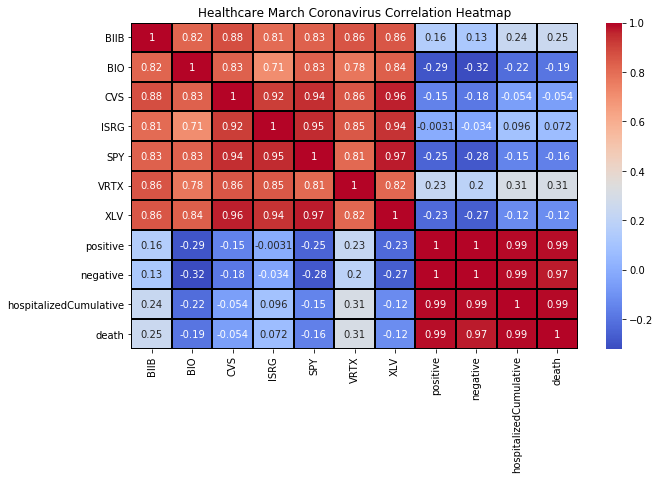

In [119]:
hc_df = yf.download(['BIIB','BIO','CVS','VRTX','ISRG','SPY','XLV'],
                  start='2020-03-01',
                  end='2020-04-01',
                  progress=False)
hc_df = hc_df['Close']
hc_march_df = pd.concat([hc_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Healthcare March Coronavirus Correlation Heatmap')
hc_march_plot = sns.heatmap(hc_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

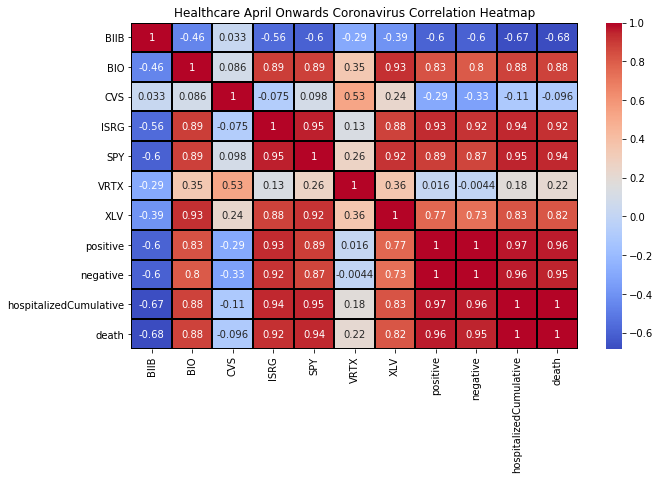

In [120]:
hc_df = yf.download(['BIIB','BIO','CVS','VRTX','ISRG','SPY','XLV'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
hc_df = hc_df['Close']
hc_fromapril_df = pd.concat([hc_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Healthcare April Onwards Coronavirus Correlation Heatmap')
hc_fromapril_plot = sns.heatmap(hc_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

Row
    [0] Matplotlib(Figure)
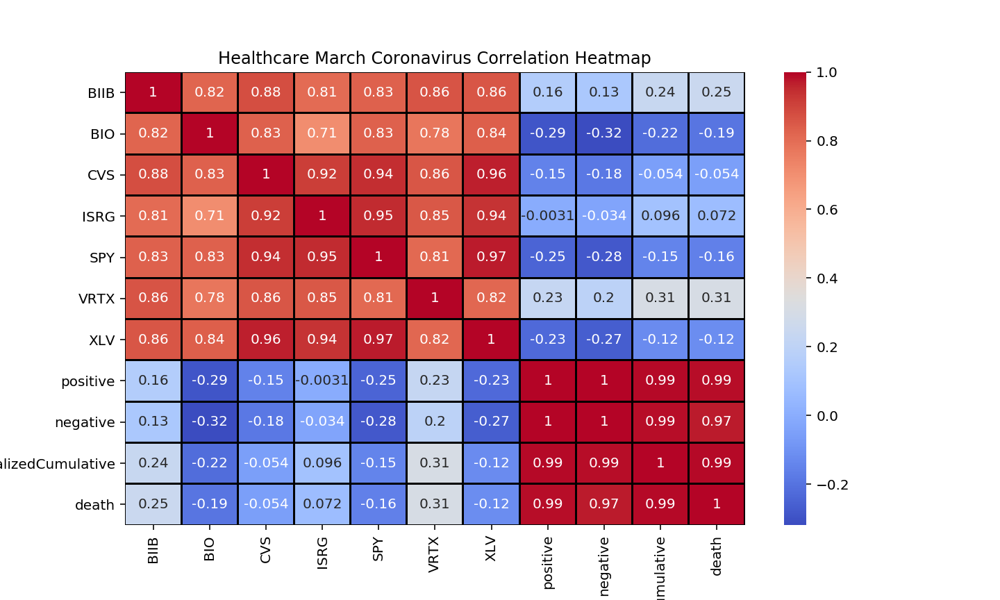

In [121]:
heat_map_row_hc = pn.Row(hc_march_plot)
heat_map_row_hc

In [122]:
heat_map_row_hc.append(hc_fromapril_plot)

Row
    [0] Matplotlib(Figure)
    [1] Matplotlib(Figure)
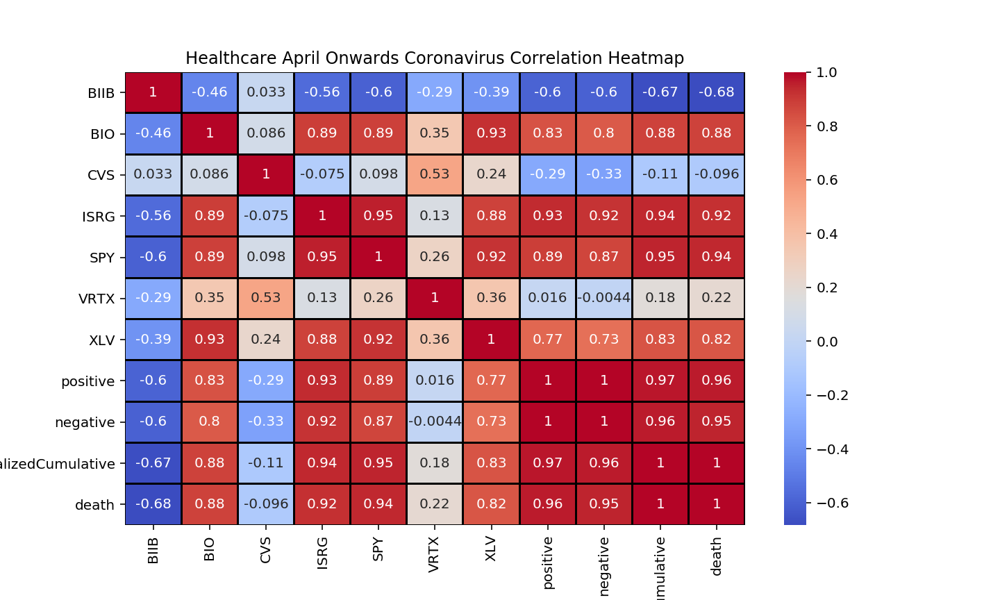
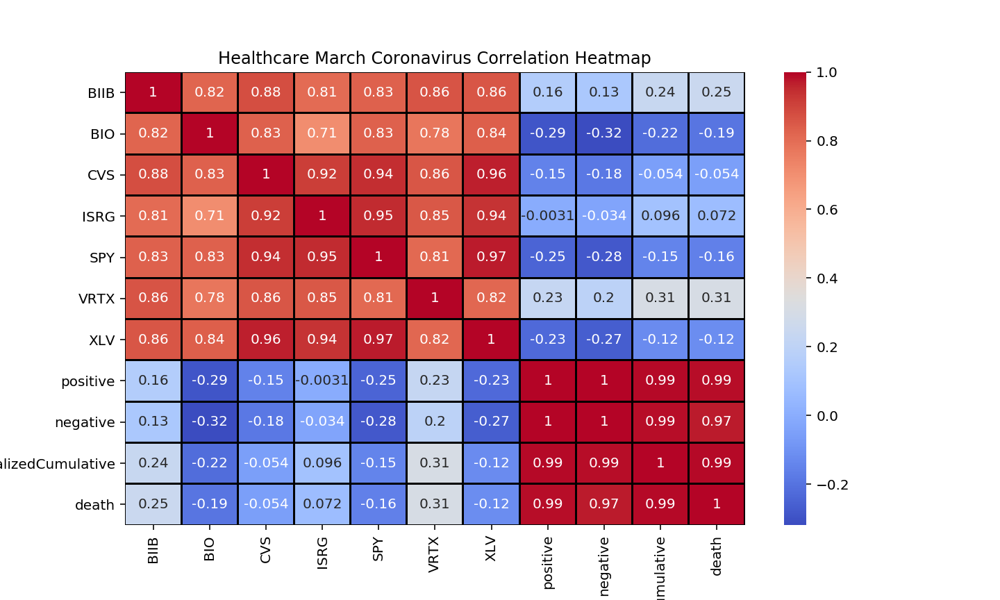

In [123]:
heat_map_row_hc

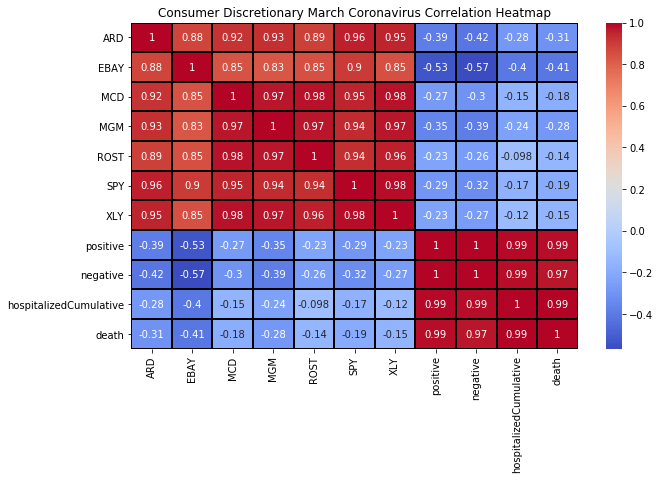

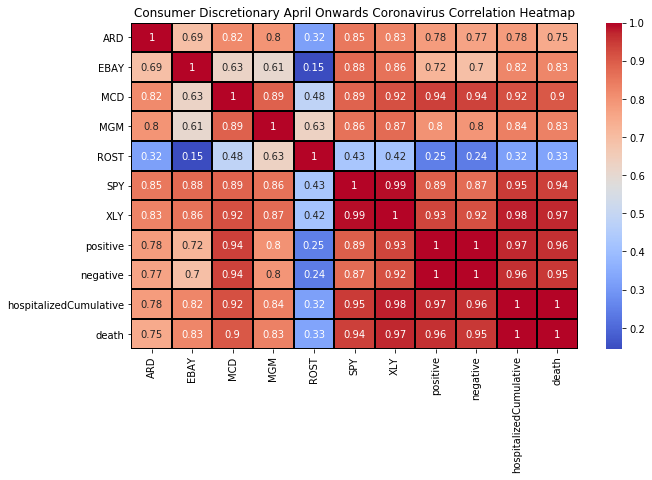

In [124]:
cd_df = yf.download(['ARD','MGM','EBAY','MCD','ROST','SPY','XLY'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
cd_df = cd_df['Close']
cd_march_df = pd.concat([cd_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Consumer Discretionary March Coronavirus Correlation Heatmap')
cd_march_plot = sns.heatmap(cd_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()
cd_df = yf.download(['ARD','MGM','EBAY','MCD','ROST','SPY','XLY'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
cd_df = cd_df['Close']
cd_fromapril_df = pd.concat([cd_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Consumer Discretionary April Onwards Coronavirus Correlation Heatmap')
dc_fromapril_plot = sns.heatmap(cd_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [125]:
heat_map_row_cd = pn.Row(cd_march_plot)
heat_map_row_cd.append(dc_fromapril_plot)

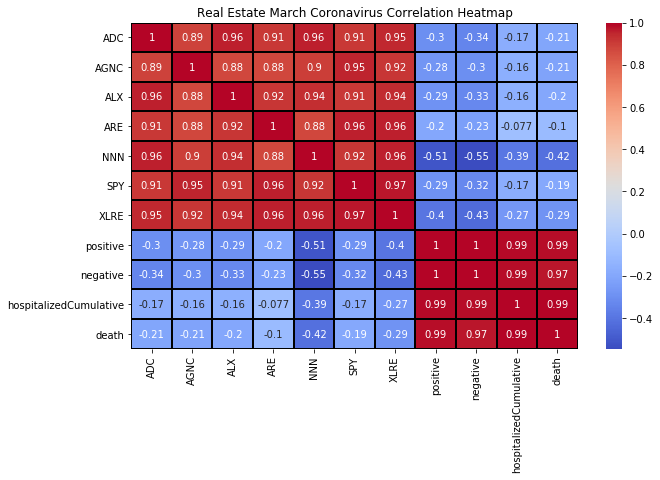

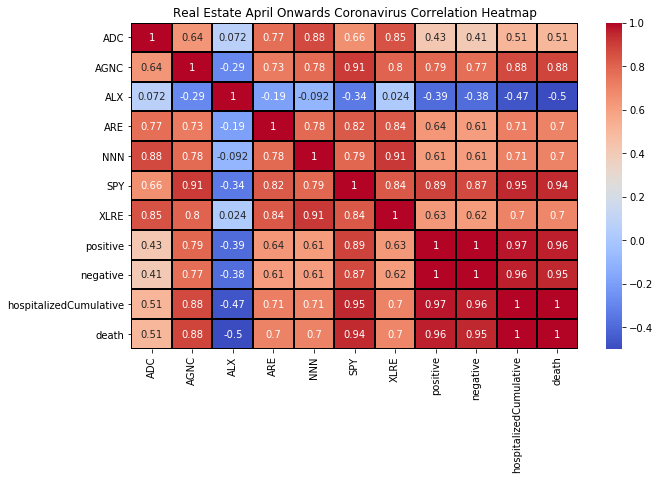

In [126]:
re_df = yf.download(['NNN','AGNC','ADC','ALX','ARE','SPY','XLRE'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
re_df = re_df['Close']
re_march_df = pd.concat([re_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Real Estate March Coronavirus Correlation Heatmap')
re_march_plot = sns.heatmap(re_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

re_df = yf.download(['NNN','AGNC','ADC','ALX','ARE','SPY','XLRE'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
re_df = re_df['Close']
re_fromapril_df = pd.concat([re_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Real Estate April Onwards Coronavirus Correlation Heatmap')
re_fromapril_plot= sns.heatmap(re_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [127]:
heat_map_row_re = pn.Row(re_march_plot)
heat_map_row_re.append(re_fromapril_plot)

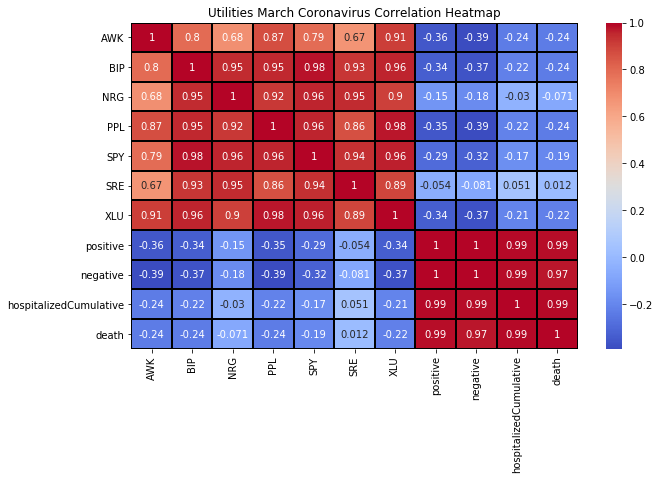

In [128]:
utilities_df = yf.download(['NRG','SRE','PPL','AWK','BIP','SPY','XLU'],
                  start='2020-03-01',
                  end='2020-03-31',
                  progress=False)
utilities_df = utilities_df['Close']
utilities_march_df = pd.concat([utilities_df,march_df], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Utilities March Coronavirus Correlation Heatmap')
utilities_march_plot= sns.heatmap(utilities_march_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

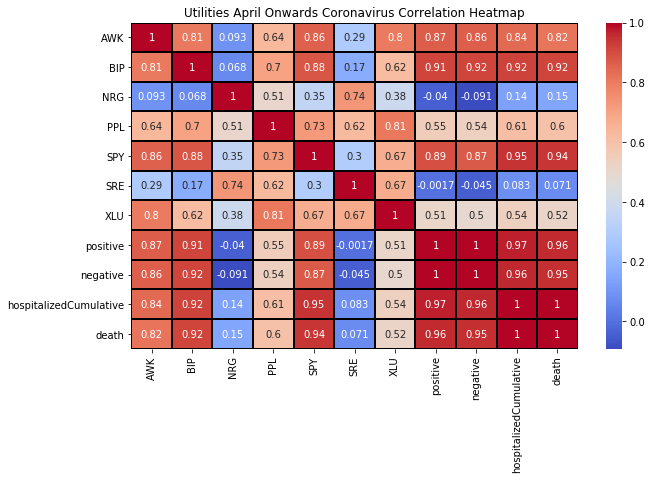

In [129]:
utilities_df = yf.download(['NRG','SRE','PPL','AWK','BIP','SPY','XLU'],
                  start='2020-04-01',
                  end='2020-12-31',
                  progress=False)
utilities_df = utilities_df['Close']
utilities_fromapril_df = pd.concat([utilities_df,from_april], axis = "columns")
fig, ax = plt.subplots(figsize=(10,6))
ax.set_title('Utilities April Onwards Coronavirus Correlation Heatmap')
utilities_fromapril_plot = sns.heatmap(utilities_fromapril_df.corr(), annot=True, cmap='coolwarm', linewidth=1, linecolor='black').get_figure()

In [130]:
heat_map_row_utilities = pn.Row(utilities_march_plot)
heat_map_row_utilities.append(utilities_fromapril_plot)

Row
    [0] Matplotlib(Figure)
    [1] Matplotlib(Figure)
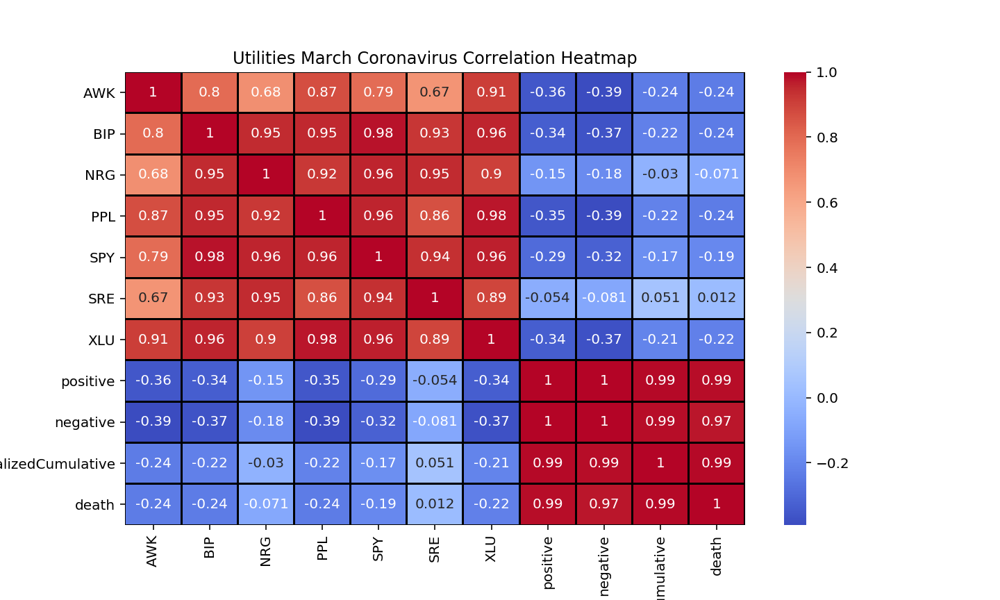
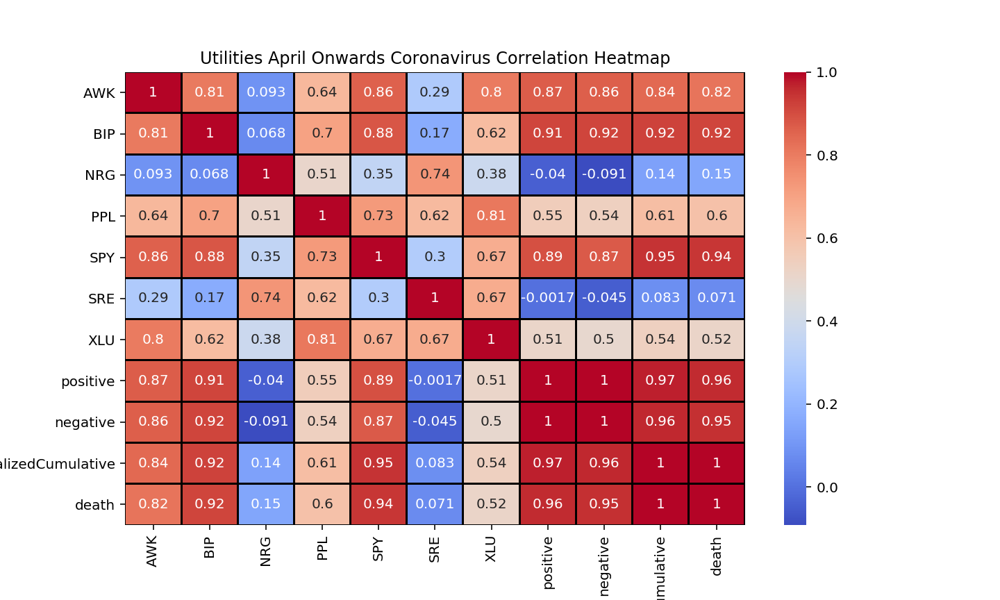

In [131]:
heat_map_row_utilities

In [141]:
Sector_breakdown_pg = pn.Column(
    "# Analyzed ETFs Breakdown per Sector",
    "### After our original dive into the data, we decided to revisit the sectors partitioned by market response. Effectively, we looked at the corrlations during the initial sell-off and subsequent recovery period. Our rationale was that a macro analysis of the prices would obscure any findings during the loss period when combined with a longer, slower, sustained recovery period.\n"
    "The leftmost heatmaps contains correlation data for the month of March and the rightmost the subsequent recovery correlation data from April onward.",
    heat_map_row_materials,
    "#### Materials\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " Ranging from 3% to 40% with positive cases, 1.6% to 45% with negative cases, and 6.7% to 36% with negative cases. On an average, the materials sector was hit by the pandemic and the impact was 35% negative performance."
    " From April however, all the stocks and ETF are positively correlated to the covid data; with a range of 55% to 97% with positive cases, 50% to 96% with negative cases and 57% to 96% with death cases."
    " This shows that market performance improved over the time period despite the pandemic. There has also been a gradula decrease in the volatility in returns for the sector.",
    heat_map_row_communications,
    "#### Communications\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " 21% to 60% with positive cases, 24% to 63% with negative cases and 13% to 50% with death cases. On an average the communications sector was hit by the pandemic and the impact was 56% negative performance."
    " From April however, except one common stock under comparison, all the others are positively correlated to the covid data, with a range of 29% to 95% with positive cases, 28% to 94% with negative cases and 32% to 98% with death cases."
    " The volatility of returns remained almost same for the securities under study.",
    heat_map_row_energy,
    "#### Energy\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " 26% to 45% with positive cases, 29% to 48% with negative cases and 21% to 38% with death cases. On an average the energy sector was hit by the pandemic and the impact was 43% negative performance."
    " From April however, couple of common stocks and the ETF under comparison are still negatively correlated and only one common stock is positively correlated to the covid data, with a range of 37% to 52% with positive cases, 39% to 56% with negative cases and 15% to 31% with death cases."
    " This shows that market performance deteriorated over the time period due to the pandemic. There has also been a decrease in the volatility in returns for the sector.",
    heat_map_row_finance,
    "#### Finance\n\n"
    "In March, most common stocks and ETF are negatively correlated with covid data. A couple of stocks under study are positively correlated. The magnitudes of positive correlations and negative correlations are similar."
    " 10% to 35% with positive cases, 13% to 35% with negative cases and 19% to 37% with death cases. On an average the industrials sector was hit by the pandemic and the impact was 36% positive to 36% negative performance."
    " From April, most of the stocks and ETF are positively correlated to the covid data, the stock that performed better despite the pandemic started going down in performance, with a range of 35% to 98% with positive cases, 32% to 92% with negative cases and 33% to 98% with death cases."
    " The performance of this sector was mixed during the pandemic. The volatilities of returns increased from April.",
    heat_map_row_industrial,
    "#### Industrials\n\n"
    "In March, most stocks and ETF are negatively correlated with covid data. A couple of stocks under study are positively correlated. The magnitudes of positive correlations and negative correlations are similar."
    " 10% to 35% with positive cases, 13% to 35% with negative cases and 19% to 37% with death cases. On an average the industrials sector was hit by the pandemic and the impact was 36% positive to 36% negative performance."
    " From April, most of the stocks and ETF are positively correlated to the covid data, the stock that performed better despite the pandemic started going down in performance, with a range of 35% to 98% with positive cases, 32% to 92% with negative cases and 33% to 98% with death cases."
    " The performance of this sector was mixed during the pandemic. The volatilities of returns increased from April.",
    heat_map_row_technology,
    "#### Technology\n\n"
    "In March, most common stocks and ETF are negatively correlated with covid data. A couple of stocks under study are positively correlated. The magnitudes of negative correlations are greater than that of positive correlations."
    " 13% to 54% negative and 2.1% to 33% positive with positive cases, 1.1% to 57% negative and 30% to 31% positive with negative cases, and 6.4% to 45% negative and 10% to 38% positive with death cases. Over all, 50% negative and 33% positively correlated with pandemic."
    " From April however, all the stocks and ETF are positively correlated to the covid data, with a range of 41% to 92% with positive cases, 42% to 96% with negative cases and 26% to 96% with death cases."
    " The performance of the sector is more stabilised and improved from April. Volatilities of the stocks remained same.",
    heat_map_row_cs,
    "#### Consumer Staples\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " 29% to 66% with positive cases, 32% to 69% with negative cases and 19% to 54% with death cases. On an average the consumer staples sector was hit by the pandemic and the impact was 61% negative performance."
    " From April however, except one of the common stock under comparison, all the other stocks and ETF are positively correlated with the covid data, with a range of 62% to 95% with positive cases, 66% to 95% with negative cases, and 58% to 94% with death cases, with an average of 95% positive correlation with the pandemic."
    " The performance of the sector improved from April and the volatility of returns reduced to a significant extent.",
    heat_map_row_hc,
    "#### Healthcare\n\n"
    " In March, the common stocks and ETF are negatively correlated with covid data."
    " 4% to 38% with positive cases, 2.8% to 41% with negative cases and 10% to 30% with death cases. On an average the health care sector was hit by the pandemic and the impact was 36% negative performance."
    " From April, most of the securities under comparison are positively correlated with the coronavirus data. The ETF is positively correlated. This shows that, most of the entities in the sector performed well and some of the entities failed to."
    " There is a mild pattern that the retail outlets in the industry failed to perform well."
    " The range of correlation being, 1.6% to 60% negative and 77% to 93% positive with positive test cases, 44% to 60% negatively and 73% to 92% positively with negative cases, and 9.6% to 68% negatively and 82% to 94% positively with death cases, with an average of 63% negatively and 93% positively with the pandemic.",
    heat_map_row_cd,
    "#### Consumer Discretionary\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " 23% to 39% with positive cases, 26% to 57% with negative cases and 14% to 41% with death cases. On an average the consumer discretionary sector was hit by the pandemic and the impact was 45% negative performance."
    " From April however, all the stocks and ETF are positively correlated to the covid data, with a range of 25% to 94% with positive cases, 24% to 94% with negative cases and 33% to 97% with death cases. Average performance correlation being, 95% positive."
    " The sector performance improved after the initial impact from the pandemic. The volatility of returns reduced.",
    heat_map_row_re,
    "#### Real Estate\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " 20% to 51% with positive cases, 23% to 55% with negative cases and 10% to 42% with death cases. On an average the real estate sector was hit by the pandemic and the impact was 46% negative performance."
    " From April, almost all the securities performed well and have a positive correlation with the increasing covid test numbers. The magnitude being, 61% to 89% with positive cases, 41% to 81% with negative cases and 51% to 94% with death cases, average correlation being, 90% Positive."
    " The sector performance improved and volatility of returns increased.",
    heat_map_row_utilities,
    "#### Utilities\n\n"
    "In March, the common stocks and ETF are negatively correlated with covid data."
    " 5.4% to 36% with positive cases, 8.1% to 39% with negative cases and 1.2% to 24% with death cases. On an average the real estate sector was hit by the pandemic and the impact was 33% negative performance."
    " From April however, the sector performance is mixed. Some securities under test are correlated positively and some are correlated negatively with a negative performance, magnitude being, 1.7% to 4% negative and 51% to 91% positive with positive test cases, 4.5% to 9.1% negatively and 54% to 92% positively with negative cases, and 7.1% to 15% negatively and 52% to 94% positively with death cases, with an average of 5% negatively and 93% positively with the pandemic."
    " The performance of the sector improved on an average and volatility of returns reduced to a significant level.",
    
)


In [142]:
dasbhboard_tabs = pn.Tabs(
    ("Introduction", Introduction_page),
    ("Overall Market Visualizations", Market_Overview_pg),
    ("Per-Sector Visualizations & Breakdown", Sector_breakdown_pg)
    
)

Tabs
    [0] Row
        [0] Markdown(str, width=1000)
    [1] Column
        [0] Markdown(str)
        [1] HoloViews(Layout)
        [2] Markdown(str)
        [3] Markdown(str)
        [4] HoloViews(NdOverlay)
        [5] Markdown(str)
        [6] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [7] Markdown(str)
    [2] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [3] Markdown(str)
        [4] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [5] Markdown(str)
        [6] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [7] Markdown(str)
        [8] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [9] Markdown(str)
        [10] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [11] Markdown(str)
        [12] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [13] Markdown(str)
        [14] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [15] Markdown(str)
        [16] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [17] Markdown(str)
        [18] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [19] Markdown(str)
        [20] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [21] Markdown(str)
        [22] Row
            [0] Matplotlib(Figure)
            [1] Matplotlib(Figure)
        [23] Markdown(str)
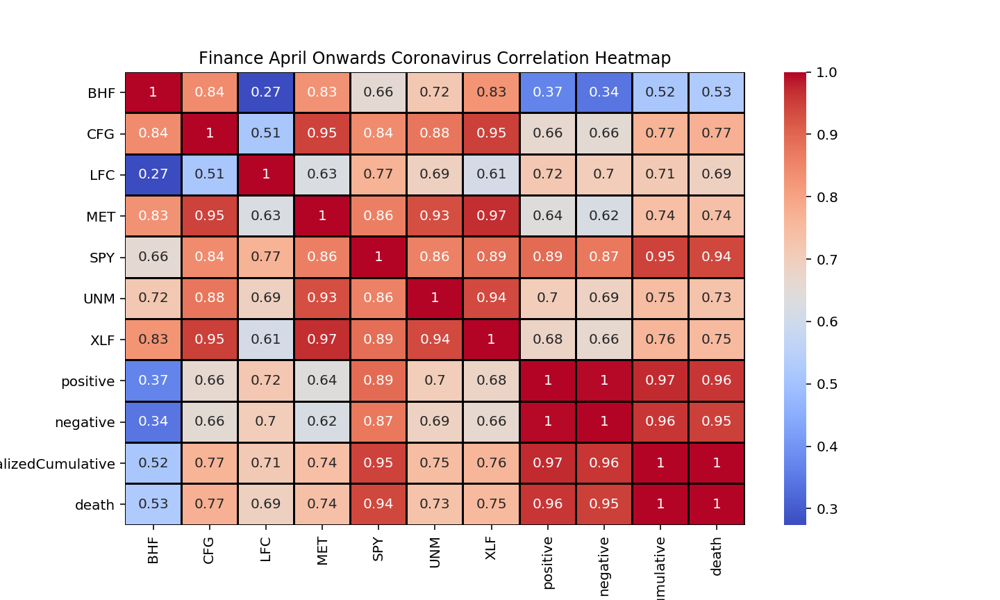
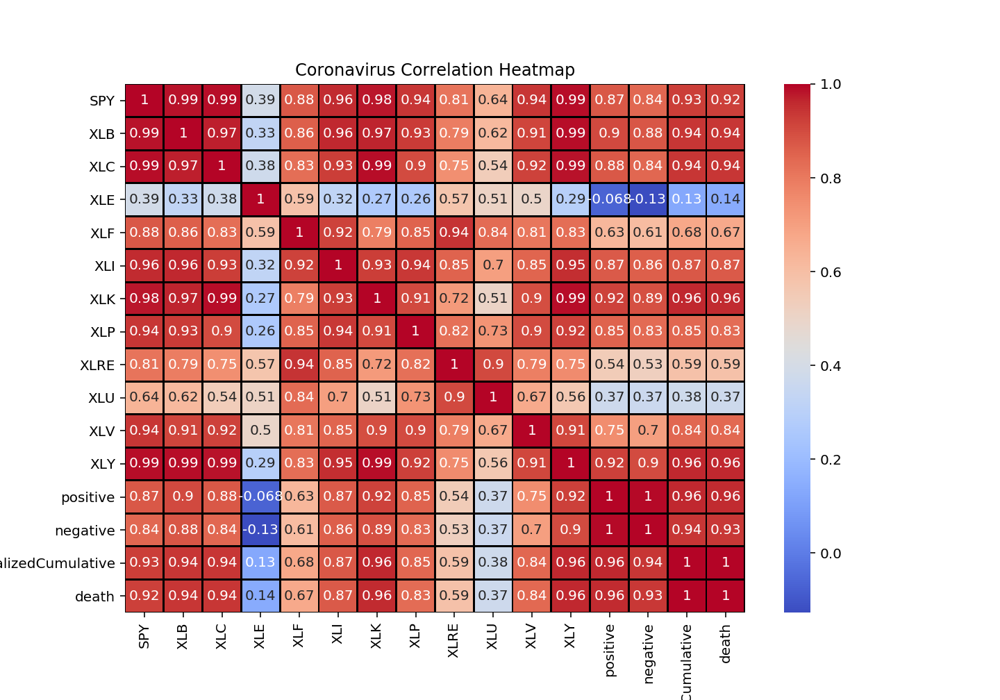
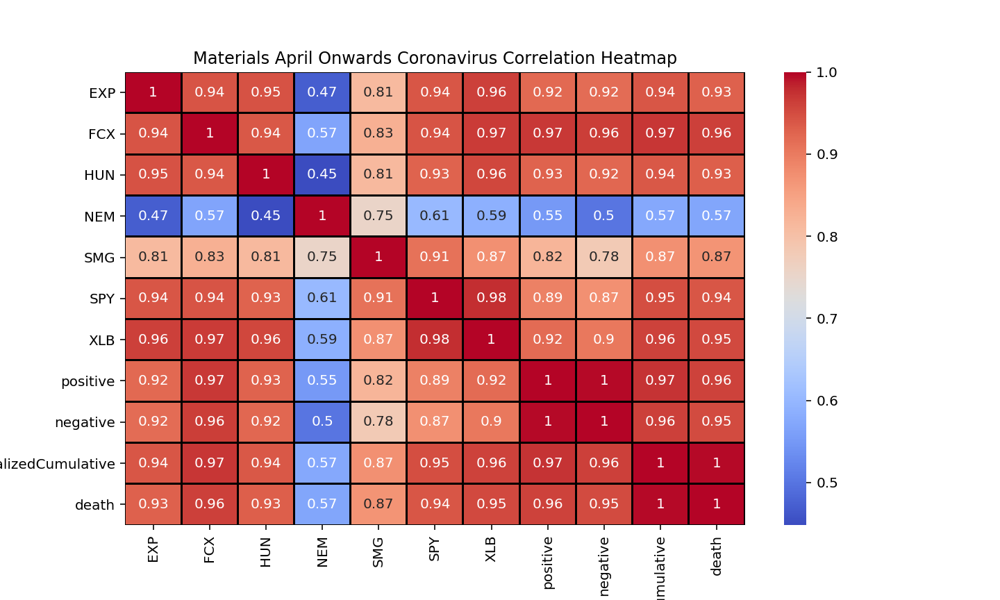
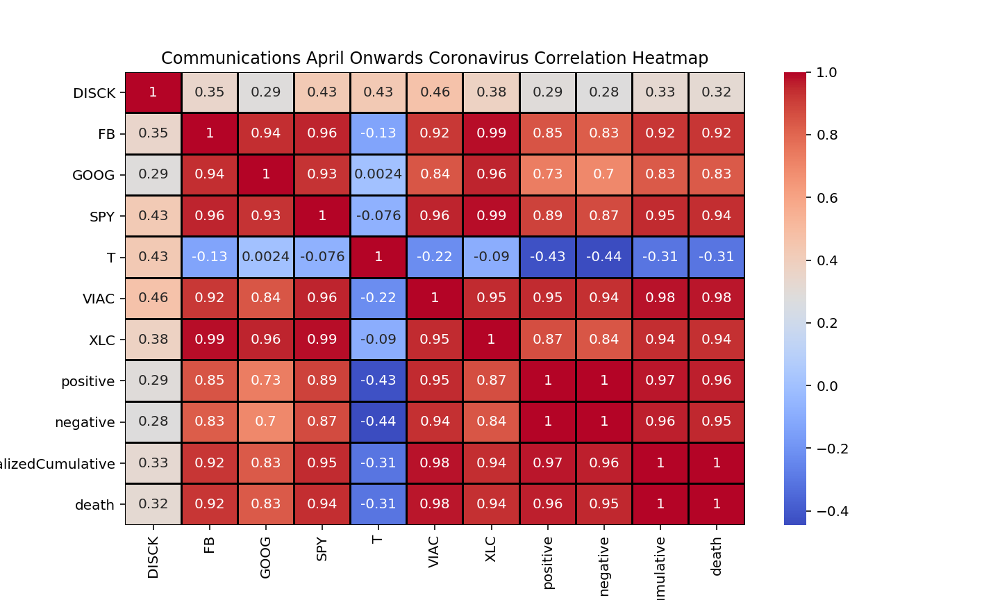
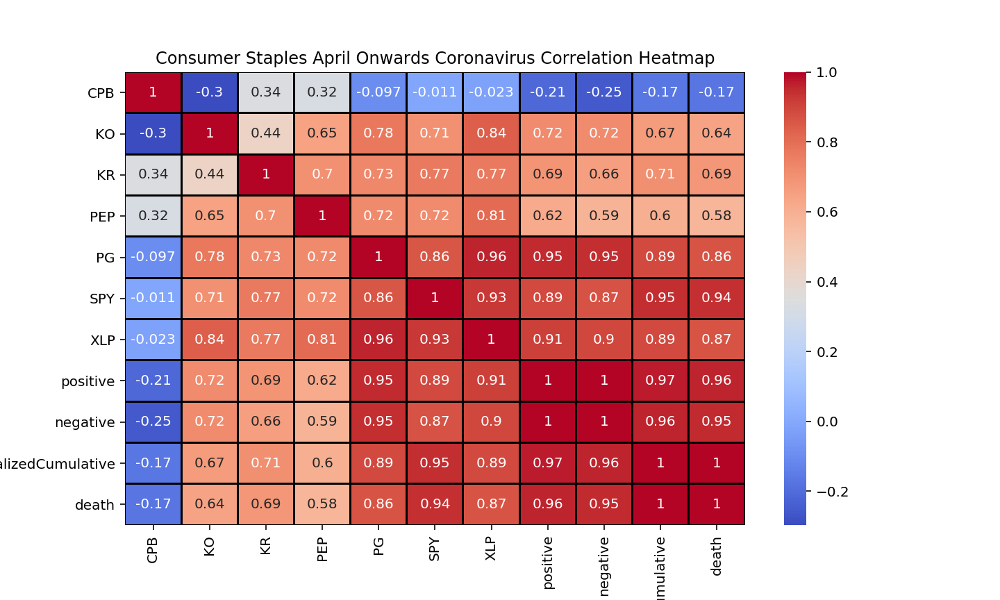
...
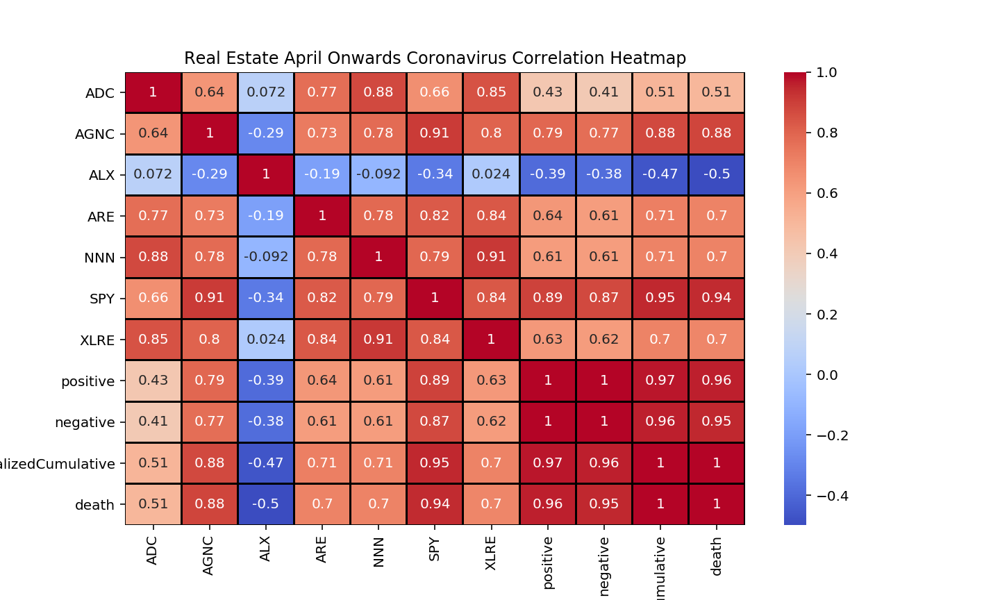
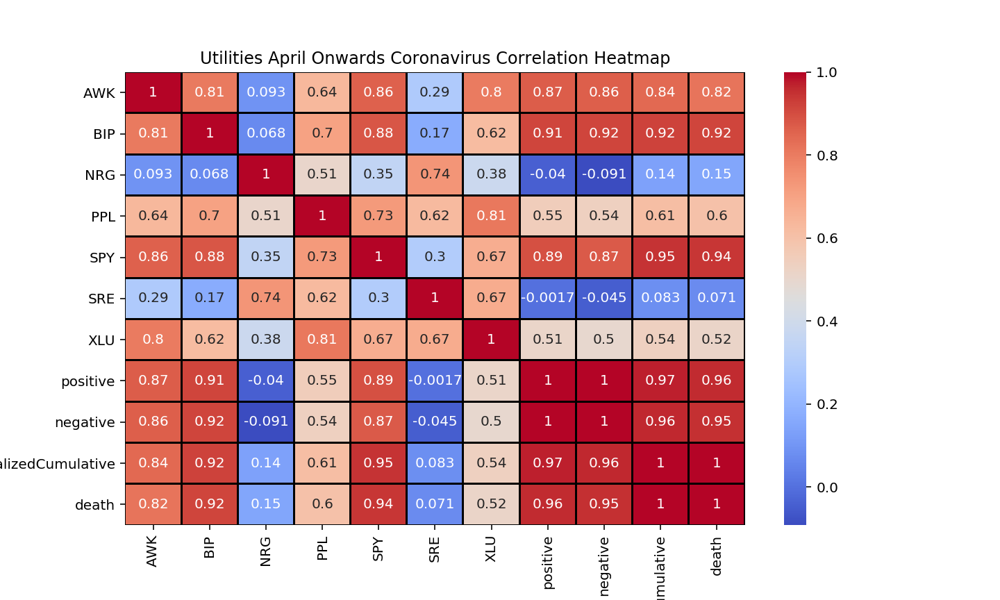
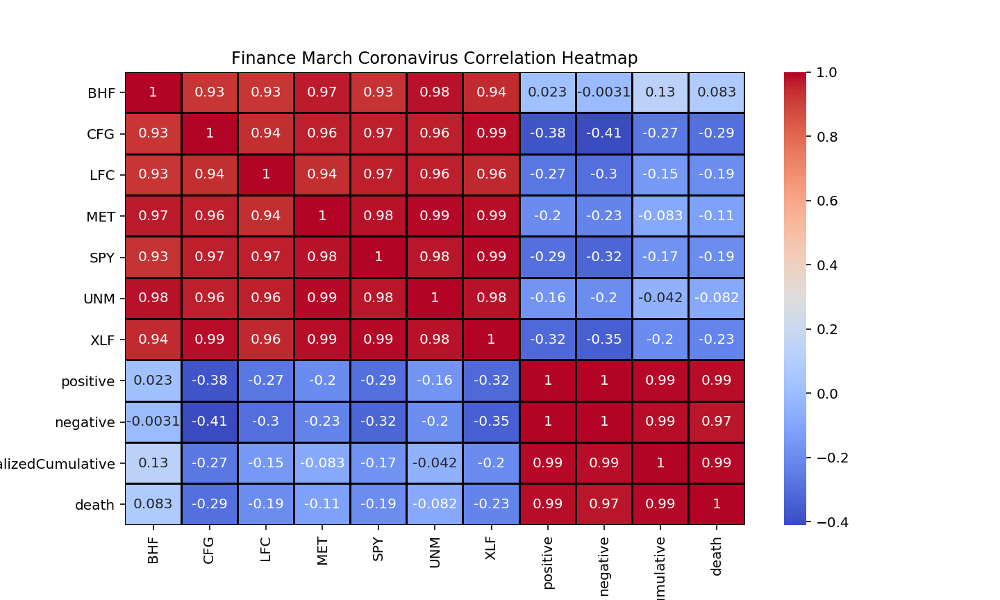
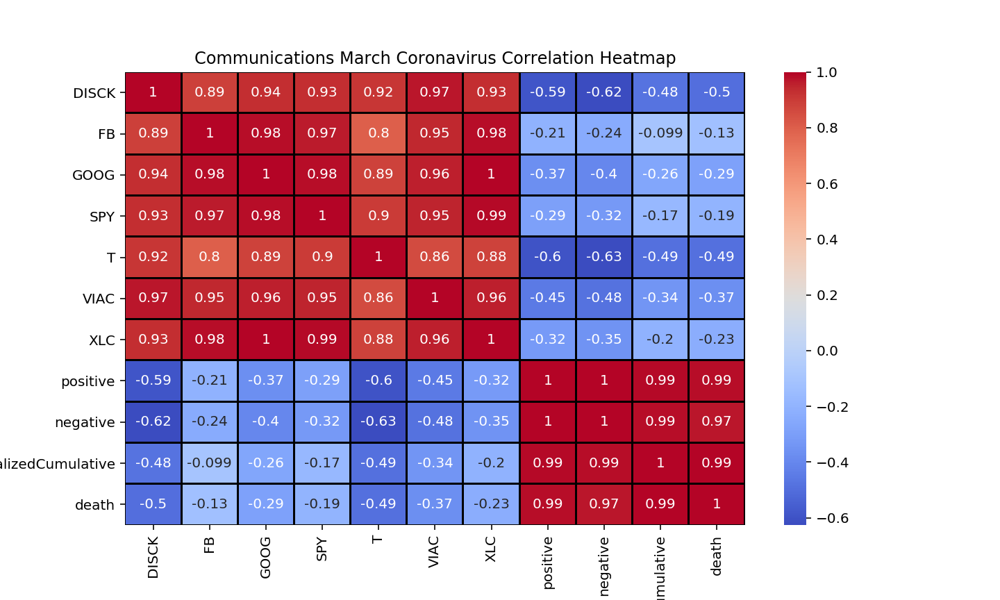
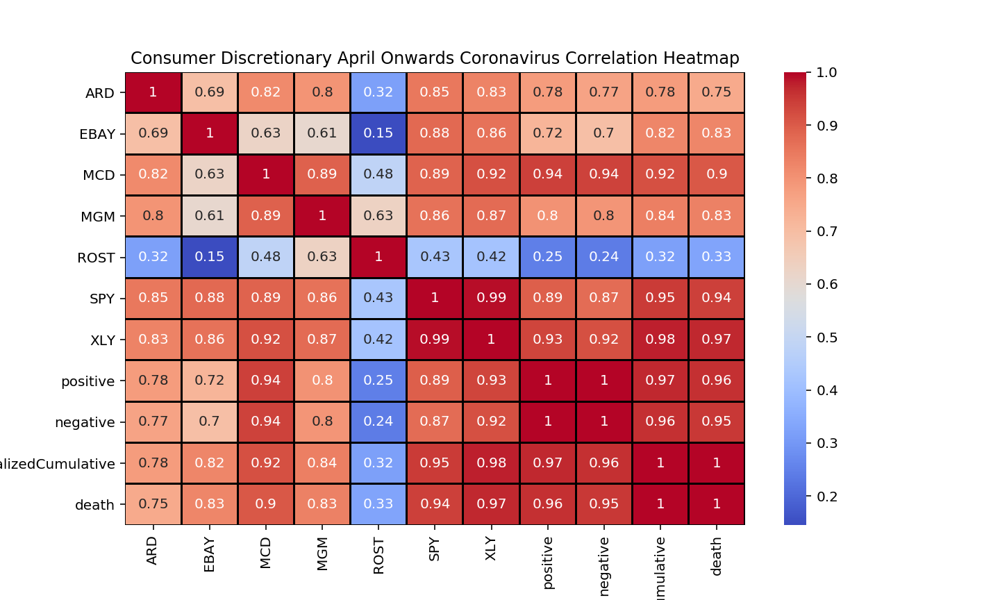

In [143]:
dasbhboard_tabs.servable()